#### **4倍加速和8倍加速后2D图像质量的指标**

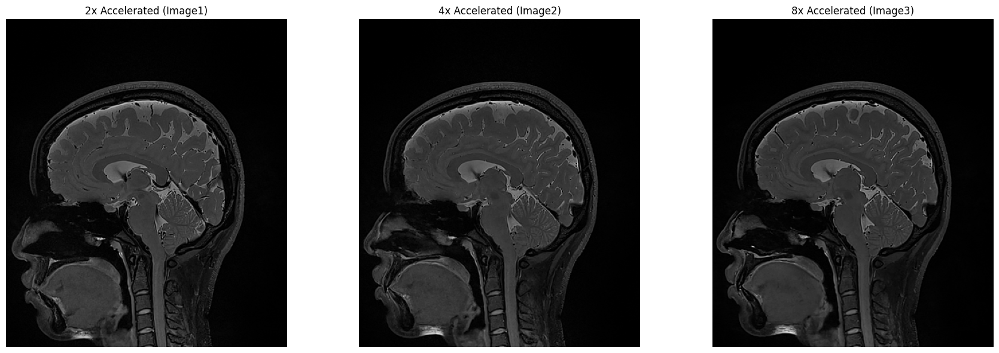

PSNR_R_4: 22.93
SSIM_R_4: 0.6614
PSNR_R_8: 22.38
SSIM_R_8: 0.6518


In [95]:
import pydicom
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

# 加载 DICOM 文件并提取像素数组
def load_dcm_image(file_path):
    dicom = pydicom.dcmread(file_path)
    image = dicom.pixel_array.astype(np.float32)  # 转换为浮点数组以便计算
    return image

# 计算 PSNR 和 SSIM
# image1为金标准
def calculate_psnr_ssim(image1, image2):
    # PSNR
    psnr_value = psnr(image1, image2, data_range=image1.max() - image1.min())
    # SSIM
    ssim_value, _ = ssim(image1, image2, full=True, data_range=image1.max() - image1.min())
    return psnr_value, ssim_value

# 替换为你的 DICOM 文件路径
file1 = r"image_final_proj\accelerate_data_dicom\pd_mx3d_sag_iso0.6mm_non_fat_145510_301\00000257.dcm"
file2 = r"image_final_proj\accelerate_data_dicom\pd_mx3d_sag_iso0.6mm_non_fat_150546_401\00000257.dcm"
file3 = r"image_final_proj\accelerate_data_dicom\pd_mx3d_sag_iso0.6mm_non_fat_151207_501\00000257.dcm"

# 加载 DICOM 图像
image1 = load_dcm_image(file1)
image2 = load_dcm_image(file2)
image3 = load_dcm_image(file3)

# 可视化三个图像
plt.figure(figsize=(18, 6))

# image1: 2倍加速
plt.subplot(1, 3, 1)
plt.title("2x Accelerated (Image1)")
plt.imshow(image1, cmap='gray')
plt.axis('off')

# image2: 4倍加速
plt.subplot(1, 3, 2)
plt.title("4x Accelerated (Image2)")
plt.imshow(image2, cmap='gray')
plt.axis('off')

# image3: 8倍加速
plt.subplot(1, 3, 3)
plt.title("8x Accelerated (Image3)")
plt.imshow(image3, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

# 计算 PSNR 和 SSIM
psnr_value2, ssim_value2 = calculate_psnr_ssim(image1, image2)
psnr_value3, ssim_value3 = calculate_psnr_ssim(image1, image3)

# 打印结果
print(f"PSNR_R_4: {psnr_value2:.2f}")
print(f"SSIM_R_4: {ssim_value2:.4f}")
print(f"PSNR_R_8: {psnr_value3:.2f}")
print(f"SSIM_R_8: {ssim_value3:.4f}")

#### **4倍加速和8倍加速后3D图像质量的指标**

In [96]:
import os
import pydicom
import numpy as np
import SimpleITK as sitk

# 加载单个文件夹中的所有 DICOM 文件，返回 3D 图像
def load_dicom_folder_as_3d_image(folder_path):
    # 获取文件夹中所有文件名，并按编号排序
    dicom_files = sorted(
        [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.dcm')],
        key=lambda x: int(os.path.basename(x).split('.')[0])
    )
    
    # 读取所有 DICOM 文件并堆叠成 3D 图像
    slices = []
    for file in dicom_files:
        dicom = pydicom.dcmread(file)
        slices.append(dicom.pixel_array.astype(np.float32))  # 转换为 float32 以便计算
    volume = np.stack(slices, axis=0)  # 堆叠成 3D 图像 (z, y, x)
    return volume

# 使用 SimpleITK 计算 3D 图像的 SSIM
def calculate_3d_ssim(image1, image2):
    img1_sitk = sitk.GetImageFromArray(image1)
    img2_sitk = sitk.GetImageFromArray(image2)
    ssim_filter = sitk.SimilarityIndexImageFilter()
    ssim_filter.Execute(img1_sitk, img2_sitk)
    ssim_value = ssim_filter.GetSimilarityIndex()
    return ssim_value

# 使用均方误差计算 3D 图像的 PSNR
def calculate_3d_psnr(image1, image2):
    mse = np.mean((image1 - image2) ** 2)
    psnr_value = 10 * np.log10((image1.max() - image1.min()) ** 2 / mse)
    return psnr_value

# 主程序
if __name__ == "__main__":
    # 文件夹路径
    gt_folder = "image_final_proj/accelerate_data_dicom/pd_mx3d_sag_iso0.6mm_non_fat_145510_301"  # 金标准
    test_folder_1 = "image_final_proj/accelerate_data_dicom/pd_mx3d_sag_iso0.6mm_non_fat_150546_401"
    test_folder_2 = "image_final_proj/accelerate_data_dicom/pd_mx3d_sag_iso0.6mm_non_fat_151207_501"

    # 加载金标准 3D 图像
    print("Loading ground truth (GT) 3D image...")
    gt_image = load_dicom_folder_as_3d_image(gt_folder)

    # 加载测试图像 1
    print("Loading test 3D image 1...")
    test_image_1 = load_dicom_folder_as_3d_image(test_folder_1)

    # 加载测试图像 2
    print("Loading test 3D image 2...")
    test_image_2 = load_dicom_folder_as_3d_image(test_folder_2)

    # 确保图像形状一致
    if gt_image.shape != test_image_1.shape or gt_image.shape != test_image_2.shape:
        raise ValueError("All 3D images must have the same shape for PSNR and SSIM calculation.")

    # 计算 Test Image 1 的指标
    print("Calculating metrics for Test Image 1...")
    psnr_value_1 = calculate_3d_psnr(gt_image, test_image_1)
    ssim_value_1 = calculate_3d_ssim(gt_image, test_image_1)
    print(f"Test Image 1 - PSNR: {psnr_value_1:.2f}, SSIM: {ssim_value_1:.4f}")

    # 计算 Test Image 2 的指标
    print("Calculating metrics for Test Image 2...")
    psnr_value_2 = calculate_3d_psnr(gt_image, test_image_2)
    ssim_value_2 = calculate_3d_ssim(gt_image, test_image_2)
    print(f"Test Image 2 - PSNR: {psnr_value_2:.2f}, SSIM: {ssim_value_2:.4f}")


Loading ground truth (GT) 3D image...
Loading test 3D image 1...
Loading test 3D image 2...
Calculating metrics for Test Image 1...
Test Image 1 - PSNR: 27.23, SSIM: 0.9922
Calculating metrics for Test Image 2...
Test Image 2 - PSNR: 26.28, SSIM: 0.9909


#### **基础mask——slice可视化**

##### **Main**

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift, ifftshift
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import numpy as np
from numpy.lib.stride_tricks import as_strided
import pydicom

In [58]:
# 加载 DICOM 文件并提取像素数组
def load_dcm_image(file_path):
    dicom = pydicom.dcmread(file_path)
    image = dicom.pixel_array.astype(np.float32)  # 转换为浮点数组以便计算
    return image

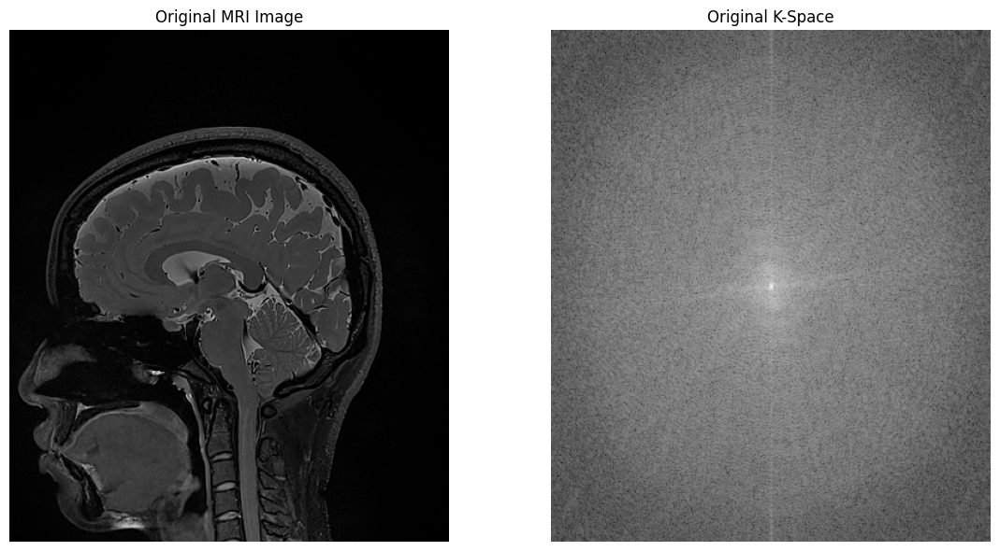

In [59]:
# 1. 读取并显示MRI图像
file1 = r"image_final_proj\accelerate_data_dicom\pd_mx3d_sag_iso0.6mm_non_fat_145510_301\00000257.dcm"
mri_image = load_dcm_image(file1)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Original MRI Image")
plt.imshow(mri_image, cmap='gray')
plt.axis('off')

# 2. 转换到k空间并显示
k_space = fftshift(fft2(mri_image))
plt.subplot(1, 2, 2)
plt.title("Original K-Space")
plt.imshow(np.log1p(np.abs(k_space)), cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()

In [60]:
# 3. 生成Mask矩阵（共6种）
# 生成随机水平线 Mask (Random Line Mask)
def random_line_mask(shape, R=0.5):
    mask = np.zeros(shape)
    mask[np.random.choice(shape[0], shape[0] // int(1/R), replace=False), :] = 1
    return mask

# 生成压缩感知 Mask (Compressive Sensing Mask)
def compressive_sensing_mask(shape, R=0.5):
    # 总像素数
    num_elements = shape[0] * shape[1]
    # 保留像素数
    num_samples = int(num_elements * R)
    # 初始化全零的 Mask
    mask = np.zeros(num_elements, dtype=np.uint8)
    # 随机选择 num_samples 个位置置为 1
    mask[:num_samples] = 1
    np.random.shuffle(mask)  # 打乱顺序
    # 恢复到 2D 形状
    mask = mask.reshape(shape)
    return mask

# 生成笛卡尔 Mask (Cartesian Mask)
def cartesian_mask(shape, R=0.5, sample_n=10, centred=True):
    def normal_pdf(length, sensitivity):
        return np.exp(-sensitivity * (np.arange(length) - length / 2) ** 2)
    Nx, Ny = shape
    # Create sampling density profile along x-axis
    pdf_x = normal_pdf(Nx, 0.5 / (Nx / 10.0) ** 2)
    lmda = Nx / (2.0 / R)
    n_lines = int(Nx * R)
    # Add uniform distribution to the sampling density
    pdf_x += lmda * 1.0 / Nx
    if sample_n:
        pdf_x[Nx // 2 - sample_n // 2:Nx // 2 + sample_n // 2] = 0
        pdf_x /= np.sum(pdf_x)
        n_lines -= sample_n
    # Generate mask along the x-axis
    mask = np.zeros((Nx, Ny))
    idx = np.random.choice(Nx, n_lines, replace=False, p=pdf_x)
    mask[idx, :] = 1
    # Ensure central lines are fully sampled
    if sample_n:
        mask[Nx // 2 - sample_n // 2:Nx // 2 + sample_n // 2, :] = 1
    if not centred:
        mask = np.fft.ifftshift(mask, axes=(0, 1))
    return mask

# 生成去除下半部分 Mask (Upper-Half Sampling Mask)
def upper_half_sampling_mask(shape, R=0.5):
    mask = np.ones(shape)
    mask[shape[0] // int(1/R) :, :] = 0
    return mask

# 生成径向 Mask (Radial Mask)
def radial_mask(shape, R=0.5):
    """
    Generate a radial mask for MRI under-sampling.
    
    Parameters:
    - shape: tuple, the shape of the image (height, width).
    - R: float, the ratio of k-space data to keep (0 < R <= 1).
    
    Returns:
    - np.array: binary mask with the same shape as the image.
    """
    height, width = shape
    center = (height // 2, width // 2)
    max_radius = np.sqrt(center[0]**2 + center[1]**2)
    num_lines = int(width * R)  # Number of radial lines to retain
    mask = np.zeros((height, width), dtype=np.float32)
    
    angles = np.linspace(0, 2*np.pi, num_lines, endpoint=False)  # Radial angles
    
    for theta in angles:
        for r in np.linspace(0, max_radius, max(height, width)):
            x = int(center[0] + r * np.cos(theta))
            y = int(center[1] + r * np.sin(theta))
            if 0 <= x < height and 0 <= y < width:
                mask[x, y] = 1
                
    return mask

# 生成螺旋 Mask (Spiral Mask)
def spiral_mask(shape, R=0.5):
    """
    Generate a spiral mask for MRI under-sampling.
    
    Parameters:
    - shape: tuple, the shape of the image (height, width).
    - R: float, the ratio of k-space data to keep (0 < R <= 1).
    
    Returns:
    - np.array: binary mask with the same shape as the image.
    """
    height, width = shape
    center = (height // 2, width // 2)
    max_radius = np.sqrt(center[0]**2 + center[1]**2)  # Extend radius to cover the full image
    num_points = int(height * width * R)
    mask = np.zeros((height, width), dtype=np.float32)

    # Increase theta range to create denser spirals
    theta = np.linspace(0, 1000 * np.pi, num_points)  # Adjust multiplier for density
    r = np.linspace(0, max_radius, num_points)    # Spiral radius range

    points_added = 0
    for i in range(num_points):
        x = int(center[0] + r[i] * np.cos(theta[i]))
        y = int(center[1] + r[i] * np.sin(theta[i]))
        if 0 <= x < height and 0 <= y < width and mask[x, y] == 0:
            mask[x, y] = 1
            points_added += 1
            if points_added >= num_points:
                break

    return mask



In [61]:
def processed_all_data(R):
    # 生成并显示6种Mask
    shape = k_space.shape
    masks = [random_line_mask(shape, R),
            compressive_sensing_mask(shape, R),
            cartesian_mask(shape, R),
            upper_half_sampling_mask(shape, R),
            radial_mask(shape, R),
            spiral_mask(shape, R)]

    titles = ["Random Line", "Compressed Sensing", 
            "Cartesian", "Upper-Half Sampling", "Radial", "Spiral"]

    plt.figure(figsize=(18, 12))
    for i, mask in enumerate(masks):
        plt.subplot(2, 3, i + 1)
        plt.title(titles[i])
        plt.imshow(mask, cmap='gray')
        plt.axis('off')
    plt.show()

    # 4. 用Mask矩阵降采样k空间并显示
    undersampled_k_spaces = [k_space * mask for mask in masks]

    plt.figure(figsize=(18, 12))
    for i, us_k_space in enumerate(undersampled_k_spaces):
        plt.subplot(2, 3, i + 1)
        plt.title(f"U.S.K. ({titles[i]})")
        plt.imshow(np.log1p(np.abs(us_k_space)), cmap='gray')
        plt.axis('off')
    plt.show()

    # 5. 逆傅里叶变换回图像域并显示降采样图像
    reconstructed_images = [np.abs(ifft2(ifftshift(us_k_space))) for us_k_space in undersampled_k_spaces]

    plt.figure(figsize=(18, 12))
    for i, recon_img in enumerate(reconstructed_images):
        plt.subplot(2, 3, i + 1)
        plt.title(f"R.I. ({titles[i]})")
        plt.imshow(recon_img, cmap='gray')
        plt.axis('off')
    plt.show()

    # 6. 计算PSNR和SSIM
    for i, recon_img in enumerate(reconstructed_images):
        psnr_value = psnr(mri_image, recon_img, data_range=mri_image.max() - mri_image.min())
        ssim_value, _  = ssim(mri_image, recon_img, full=True, data_range=recon_img.max() - recon_img.min())
        print(f"{titles[i]}: PSNR = {psnr_value:.2f}, SSIM = {ssim_value:.4f}")


##### **4倍加速**

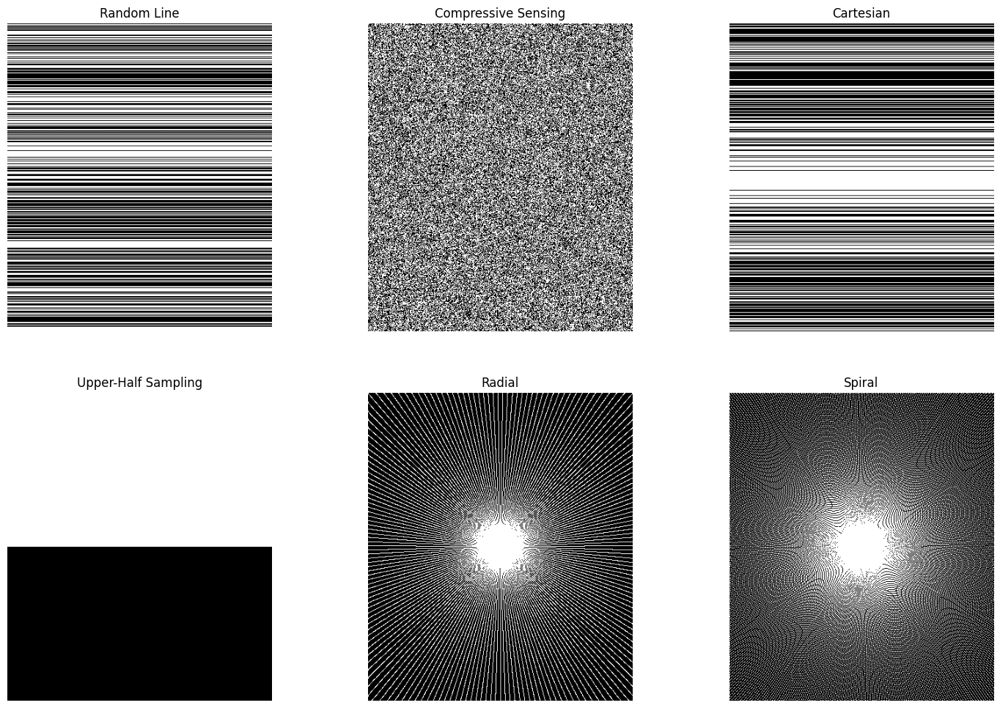

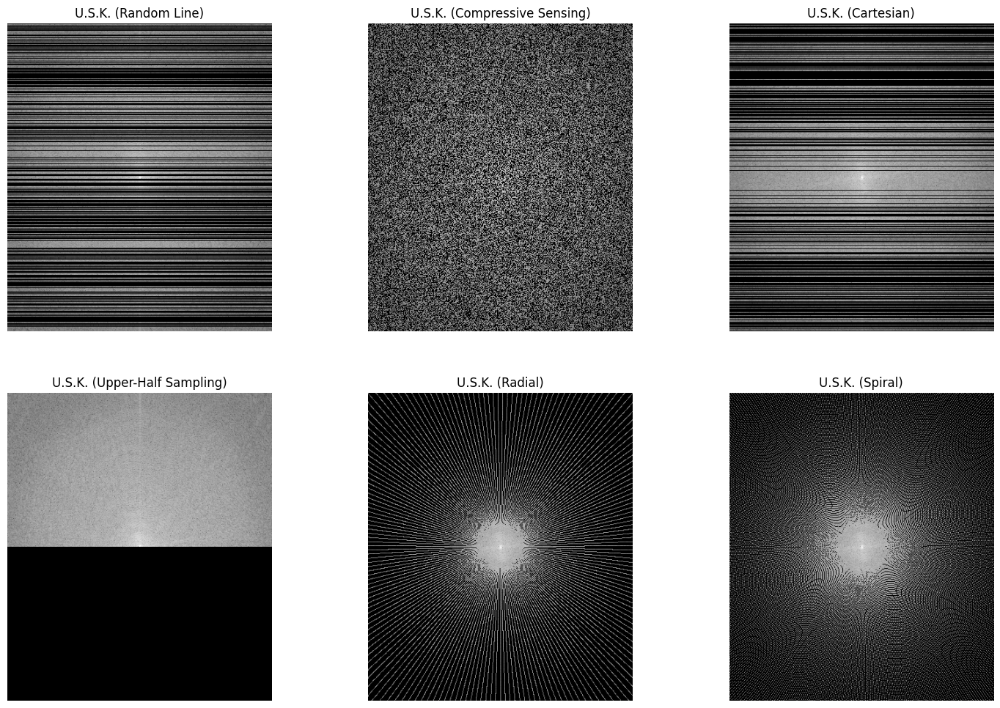

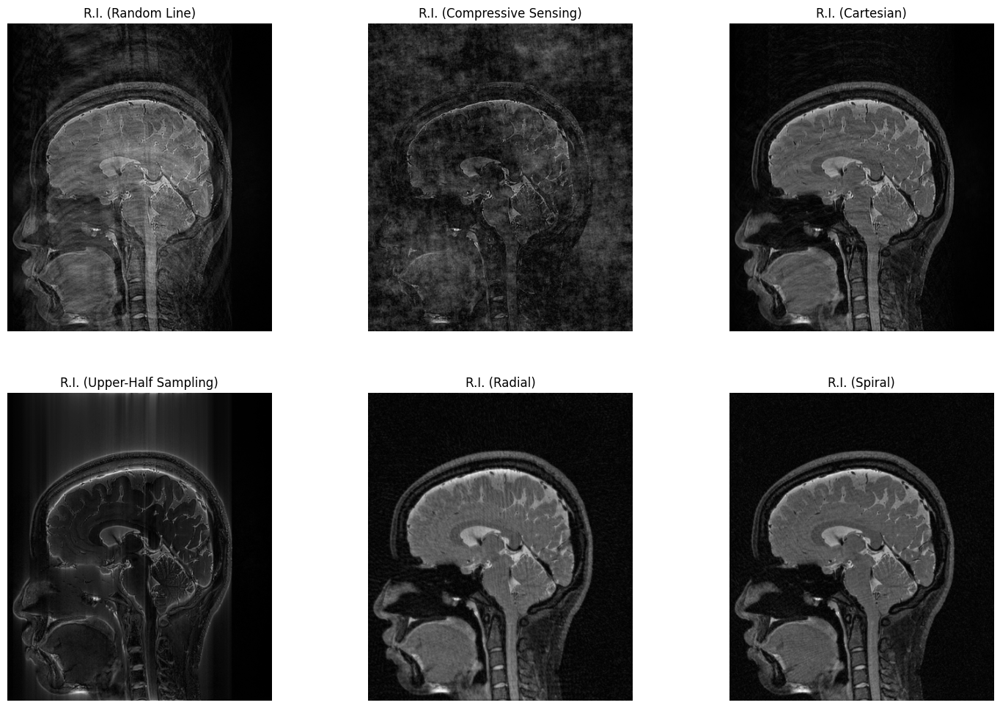

Random Line: PSNR = 24.79, SSIM = 0.5696
Compressive Sensing: PSNR = 19.13, SSIM = 0.1919
Cartesian: PSNR = 31.38, SSIM = 0.7598
Upper-Half Sampling: PSNR = 18.73, SSIM = 0.3415
Radial: PSNR = 29.91, SSIM = 0.6207
Spiral: PSNR = 31.33, SSIM = 0.6774


In [62]:
processed_all_data(R=0.5)

##### **8倍加速**

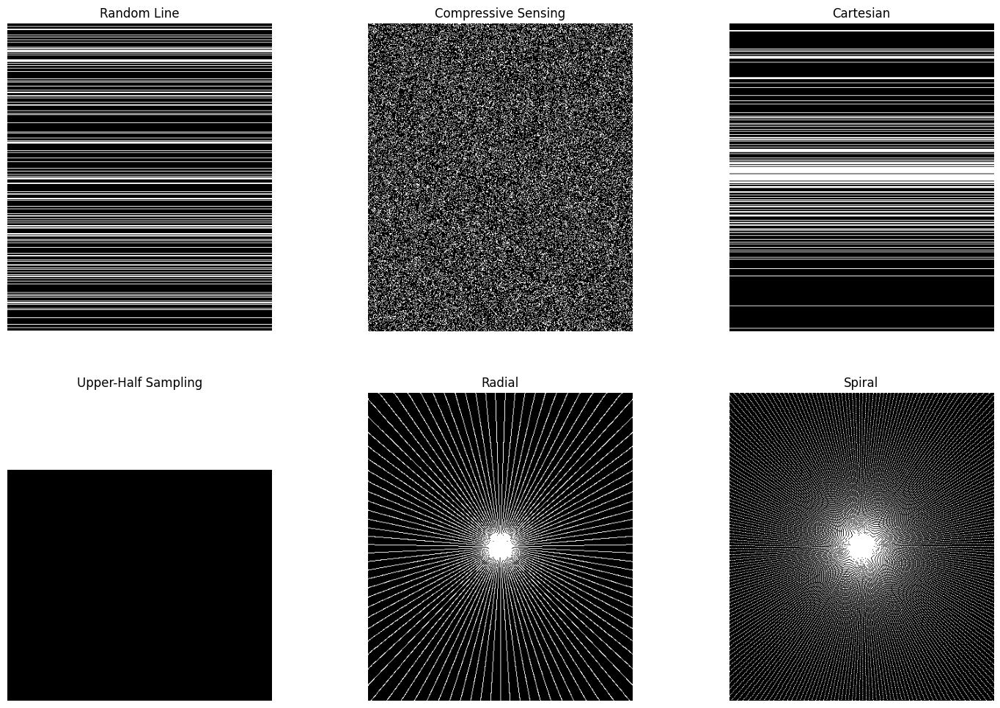

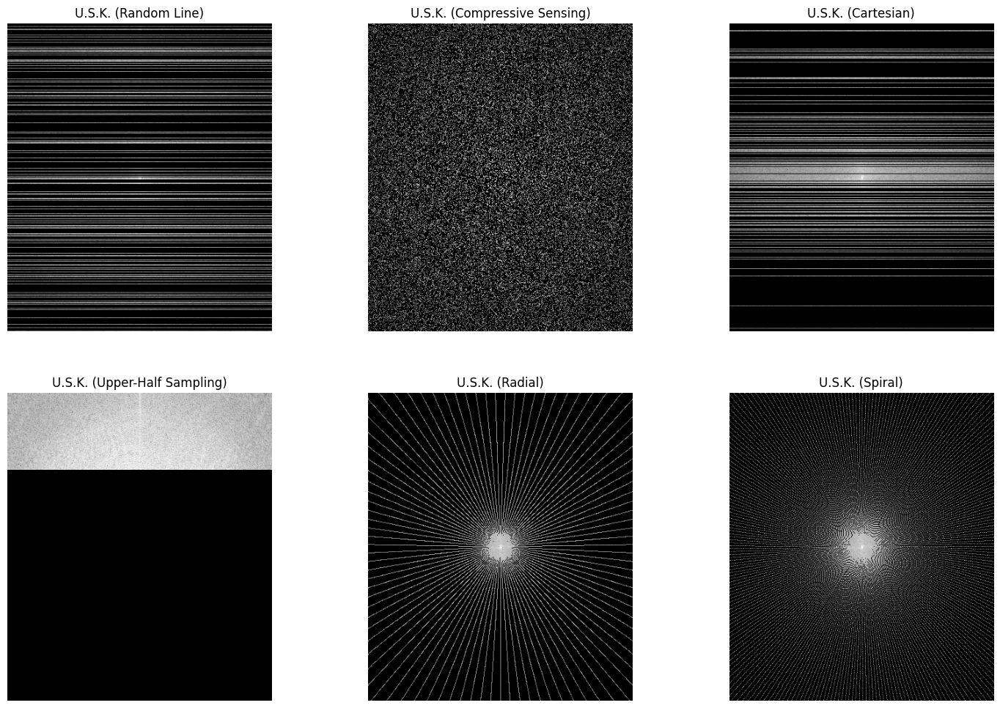

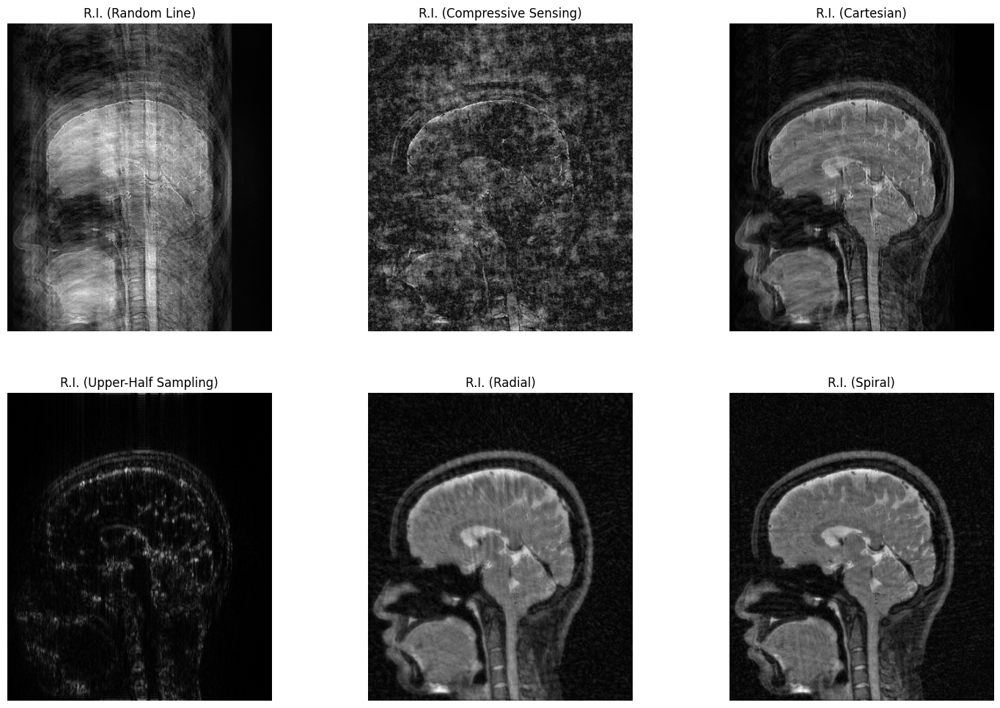

Random Line: PSNR = 23.02, SSIM = 0.3892
Compressive Sensing: PSNR = 17.80, SSIM = 0.0558
Cartesian: PSNR = 27.36, SSIM = 0.5960
Upper-Half Sampling: PSNR = 16.52, SSIM = 0.1502
Radial: PSNR = 27.42, SSIM = 0.4776
Spiral: PSNR = 28.37, SSIM = 0.5241


In [63]:
processed_all_data(R=0.25)

#### **基础mask————3D**

##### **Main**

In [65]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift, ifftshift
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import pydicom
from numpy.lib.stride_tricks import as_strided



In [66]:
# 读取 DICOM 图像并归一化
def load_dcm_image(filepath):
    dicom = pydicom.dcmread(filepath)
    img = dicom.pixel_array
    img = (img - np.min(img)) / (np.max(img) - np.min(img))  # 归一化到 [0, 1]
    return img

def undersample_and_reconstruct(image, mask):
    """
    对图像进行降采样并重建。
    
    Args:
        image: 原始图像 (2D array)
        mask: Mask 矩阵 (2D array)
    
    Returns:
        reconstructed_image: 降采样后重建的图像 (2D array)
    """
    k_space = fftshift(fft2(image))         # 转换到 k 空间
    undersampled_k_space = k_space * mask  # 应用 Mask
    reconstructed_image = np.abs(ifft2(ifftshift(undersampled_k_space)))  # 逆傅里叶变换
    return reconstructed_image

In [67]:
# 生成随机水平线 Mask (Random Line Mask)
def random_line_mask(shape, R=0.5):
    mask = np.zeros(shape)
    mask[np.random.choice(shape[0], shape[0] // int(1/R), replace=False), :] = 1
    return mask

# 生成压缩感知 Mask (Compressive Sensing Mask)
def compressive_sensing_mask(shape, R=0.5):
    # 总像素数
    num_elements = shape[0] * shape[1]
    # 保留像素数
    num_samples = int(num_elements * R)
    # 初始化全零的 Mask
    mask = np.zeros(num_elements, dtype=np.uint8)
    # 随机选择 num_samples 个位置置为 1
    mask[:num_samples] = 1
    np.random.shuffle(mask)  # 打乱顺序
    # 恢复到 2D 形状
    mask = mask.reshape(shape)
    return mask

# 生成笛卡尔 Mask (Cartesian Mask)
def cartesian_mask(shape, R=0.5, sample_n=10, centred=True):
    def normal_pdf(length, sensitivity):
        return np.exp(-sensitivity * (np.arange(length) - length / 2) ** 2)
    Nx, Ny = shape
    # Create sampling density profile along x-axis
    pdf_x = normal_pdf(Nx, 0.5 / (Nx / 10.0) ** 2)
    lmda = Nx / (2.0 / R)
    n_lines = int(Nx * R)
    # Add uniform distribution to the sampling density
    pdf_x += lmda * 1.0 / Nx
    if sample_n:
        pdf_x[Nx // 2 - sample_n // 2:Nx // 2 + sample_n // 2] = 0
        pdf_x /= np.sum(pdf_x)
        n_lines -= sample_n
    # Generate mask along the x-axis
    mask = np.zeros((Nx, Ny))
    idx = np.random.choice(Nx, n_lines, replace=False, p=pdf_x)
    mask[idx, :] = 1
    # Ensure central lines are fully sampled
    if sample_n:
        mask[Nx // 2 - sample_n // 2:Nx // 2 + sample_n // 2, :] = 1
    if not centred:
        mask = np.fft.ifftshift(mask, axes=(0, 1))
    return mask

# 生成去除下半部分 Mask (Upper-Half Sampling Mask)
def upper_half_sampling_mask(shape, R=0.5):
    mask = np.ones(shape)
    mask[shape[0] // int(1/R) :, :] = 0
    return mask

# 生成径向 Mask (Radial Mask)
def radial_mask(shape, R=0.5):
    """
    Generate a radial mask for MRI under-sampling.
    
    Parameters:
    - shape: tuple, the shape of the image (height, width).
    - R: float, the ratio of k-space data to keep (0 < R <= 1).
    
    Returns:
    - np.array: binary mask with the same shape as the image.
    """
    height, width = shape
    center = (height // 2, width // 2)
    max_radius = np.sqrt(center[0]**2 + center[1]**2)
    num_lines = int(width * R)  # Number of radial lines to retain
    mask = np.zeros((height, width), dtype=np.float32)
    
    angles = np.linspace(0, 2*np.pi, num_lines, endpoint=False)  # Radial angles
    
    for theta in angles:
        for r in np.linspace(0, max_radius, max(height, width)):
            x = int(center[0] + r * np.cos(theta))
            y = int(center[1] + r * np.sin(theta))
            if 0 <= x < height and 0 <= y < width:
                mask[x, y] = 1
                
    return mask

# 生成螺旋 Mask (Spiral Mask)
def spiral_mask(shape, R=0.5):
    """
    Generate a spiral mask for MRI under-sampling.
    
    Parameters:
    - shape: tuple, the shape of the image (height, width).
    - R: float, the ratio of k-space data to keep (0 < R <= 1).
    
    Returns:
    - np.array: binary mask with the same shape as the image.
    """
    height, width = shape
    center = (height // 2, width // 2)
    max_radius = np.sqrt(center[0]**2 + center[1]**2)  # Extend radius to cover the full image
    num_points = int(height * width * R)
    mask = np.zeros((height, width), dtype=np.float32)

    # Increase theta range to create denser spirals
    theta = np.linspace(0, 1000 * np.pi, num_points)  # Adjust multiplier for density
    r = np.linspace(0, max_radius, num_points)    # Spiral radius range

    points_added = 0
    for i in range(num_points):
        x = int(center[0] + r[i] * np.cos(theta[i]))
        y = int(center[1] + r[i] * np.sin(theta[i]))
        if 0 <= x < height and 0 <= y < width and mask[x, y] == 0:
            mask[x, y] = 1
            points_added += 1
            if points_added >= num_points:
                break

    return mask



In [73]:
def process_3D_data(R):
    folder_path = r"image_final_proj\accelerate_data_dicom\pd_mx3d_sag_iso0.6mm_non_fat_145510_301"

    # 获取所有 DICOM 文件路径
    files = sorted([os.path.join(folder_path, f) for f in os.listdir(folder_path) 
                    if f.endswith('.dcm')])

    # 初始化指标记录
    metrics = {
        "random_line": {"psnr": [], "ssim": []},
        "compressive_sensing": {"psnr": [], "ssim": []},
        "cartesian": {"psnr": [], "ssim": []},
        "upper_half_sampling": {"psnr": [], "ssim": []},
        "radial": {"psnr": [], "ssim": []},
        "spiral": {"psnr": [], "ssim": []}
    }

    # 遍历所有图像
    for i, file in enumerate(files):
        print(f"Processing {i + 1}/{len(files)}...")
        mri_image = load_dcm_image(file)  # 加载图像

        shape = mri_image.shape
        # 生成三种 Mask
        masks = {
            "random_line": random_line_mask(shape, R),
            "compressive_sensing": compressive_sensing_mask(shape, R),
            "cartesian": cartesian_mask(shape, R),
            "upper_half_sampling": upper_half_sampling_mask(shape, R),
            "radial": radial_mask(shape, R),
            "spiral": spiral_mask(shape, R)
        }

        # 对每种 Mask 进行降采样和重建，并计算指标
        for mask_name, mask in masks.items():
            reconstructed_image = undersample_and_reconstruct(mri_image, mask)
            psnr_value = psnr(mri_image, reconstructed_image, 
                            data_range=mri_image.max() - mri_image.min())
            ssim_value = ssim(mri_image, reconstructed_image, 
                            data_range=reconstructed_image.max() - reconstructed_image.min())
            metrics[mask_name]["psnr"].append(psnr_value)
            metrics[mask_name]["ssim"].append(ssim_value)

    # 计算平均值
    results = {mask_name: {
        "avg_psnr": np.mean(data["psnr"]),
        "avg_ssim": np.mean(data["ssim"])
    } for mask_name, data in metrics.items()}

    # 输出结果
    for mask_name, metrics in results.items():
        print(f"{mask_name} - Average PSNR: {metrics['avg_psnr']:.2f}, Average SSIM: {metrics['avg_ssim']:.4f}")


##### **4倍加速**

In [74]:
process_3D_data(R=0.5)

Processing 1/560...
Processing 2/560...
Processing 3/560...
Processing 4/560...
Processing 5/560...
Processing 6/560...
Processing 7/560...
Processing 8/560...
Processing 9/560...
Processing 10/560...
Processing 11/560...
Processing 12/560...
Processing 13/560...
Processing 14/560...
Processing 15/560...
Processing 16/560...
Processing 17/560...
Processing 18/560...
Processing 19/560...
Processing 20/560...
Processing 21/560...
Processing 22/560...
Processing 23/560...
Processing 24/560...
Processing 25/560...
Processing 26/560...
Processing 27/560...
Processing 28/560...
Processing 29/560...
Processing 30/560...
Processing 31/560...
Processing 32/560...
Processing 33/560...
Processing 34/560...
Processing 35/560...
Processing 36/560...
Processing 37/560...
Processing 38/560...
Processing 39/560...
Processing 40/560...
Processing 41/560...
Processing 42/560...
Processing 43/560...
Processing 44/560...
Processing 45/560...
Processing 46/560...
Processing 47/560...
Processing 48/560...
P

##### **8倍加速**

In [75]:
process_3D_data(R=0.25)

Processing 1/560...
Processing 2/560...
Processing 3/560...
Processing 4/560...
Processing 5/560...
Processing 6/560...
Processing 7/560...
Processing 8/560...
Processing 9/560...
Processing 10/560...
Processing 11/560...
Processing 12/560...
Processing 13/560...
Processing 14/560...
Processing 15/560...
Processing 16/560...
Processing 17/560...
Processing 18/560...
Processing 19/560...
Processing 20/560...
Processing 21/560...
Processing 22/560...
Processing 23/560...
Processing 24/560...
Processing 25/560...
Processing 26/560...
Processing 27/560...
Processing 28/560...
Processing 29/560...
Processing 30/560...
Processing 31/560...
Processing 32/560...
Processing 33/560...
Processing 34/560...
Processing 35/560...
Processing 36/560...
Processing 37/560...
Processing 38/560...
Processing 39/560...
Processing 40/560...
Processing 41/560...
Processing 42/560...
Processing 43/560...
Processing 44/560...
Processing 45/560...
Processing 46/560...
Processing 47/560...
Processing 48/560...
P

#### **球形mask**

##### **Main**

In [78]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fftn, ifftn, fftshift, ifftshift
import SimpleITK as sitk
from skimage.metrics import peak_signal_noise_ratio as psnr
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift, ifftshift
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import pydicom
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift, ifftshift
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from mpl_toolkits.mplot3d import Axes3D
import math

In [79]:
# 读取 DICOM 图像并归一化
def load_dcm_image(filepath):
    dicom = pydicom.dcmread(filepath)
    img = dicom.pixel_array
    img = (img - np.min(img)) / (np.max(img) - np.min(img))  # 归一化到 [0, 1]
    return img

# 1. 加载560张2D图像并组成3D图像
def load_dcm_images_to_3d(folder_path):
    files = sorted([os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.dcm')])
    slices = [load_dcm_image(file) for file in files]  # 使用之前定义的加载单张图像的函数
    im_3D = np.stack(slices, axis=0)  # 组合成3D图像
    return im_3D


In [89]:
def calculate_radius(volume):
    radius = (3 * volume / (4 * math.pi)) ** (1/3)
    return radius

def spherical_mask(shape, R=0.5):
    # 计算半径
    size = shape[0] * shape[1] * shape[2]
    volume = size * R
    radius = calculate_radius(volume)
    
    # 创建一个空的 3D 网格
    x, y, z = np.indices(shape)
    # 计算每个点到中心的距离
    center = np.array(shape) / 2
    distances = np.sqrt((x - center[0])**2 + (y - center[1])**2 + (z - center[2])**2)
    # 生成球形 mask
    mask = distances <= radius
    return mask.astype(int)  # 返回二值化的 mask

In [91]:
# 降采样过程函数（3D）
def undersample_and_reconstruct_3d(volume, mask):
    k_space = fftshift(fftn(volume))  # 转换到 k 空间
    undersampled_k_space = k_space * mask  # 应用球形 Mask
    reconstructed_volume = np.abs(ifftn(ifftshift(undersampled_k_space)))  # 逆傅里叶变换
    return k_space, undersampled_k_space, reconstructed_volume


# 可视化2D切片
def visualize_2d_slice(original, k_space, mask, undersampled_image, undersampled_k_space, slice_idx):
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 3, 1)
    plt.title("Original Image (Slice)")
    plt.imshow(original[slice_idx], cmap='gray')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.title("Original K-Space (Slice)")
    plt.imshow(np.log1p(np.abs(k_space[slice_idx])), cmap='gray')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.title("Mask (Slice)")
    plt.imshow(mask[slice_idx], cmap='gray')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.title("Undersampled Image (Slice)")
    plt.imshow(undersampled_image[slice_idx], cmap='gray')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.title("Undersampled K-Space (Slice)")
    plt.imshow(np.log1p(np.abs(undersampled_k_space[slice_idx])), cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# 计算PSNR和SSIM（3D）
def calculate_metrics_3d(original_volume, reconstructed_volume):
    psnr_value = psnr(original_volume, reconstructed_volume, data_range=original_volume.max() - original_volume.min())
    
    original_sitk = sitk.GetImageFromArray(original_volume)
    reconstructed_sitk = sitk.GetImageFromArray(reconstructed_volume)
    similarity_filter = sitk.SimilarityIndexImageFilter()
    similarity_filter.Execute(original_sitk > 0, reconstructed_sitk > 0)
    ssim_value = similarity_filter.GetSimilarityIndex()
    
    return psnr_value, ssim_value


In [92]:
def process_3D_data_spherical_mask(R):
    # 主流程
    folder_path = r"image_final_proj\accelerate_data_dicom\pd_mx3d_sag_iso0.6mm_non_fat_145510_301"
    volume_3d = load_dcm_images_to_3d(folder_path)  # 加载3D图像
    shape = volume_3d.shape
    mask_3d = spherical_mask(shape, R)  # 生成球形 Mask

    # 对3D图像进行降采样和重建
    k_space, undersampled_k_space, reconstructed_volume = undersample_and_reconstruct_3d(volume_3d, mask_3d)

    # 选择中间切片进行可视化
    slice_idx = volume_3d.shape[0] // 2
    visualize_2d_slice(volume_3d, k_space, mask_3d, reconstructed_volume, undersampled_k_space, slice_idx)

    # 计算PSNR和SSIM
    psnr_value, ssim_value = calculate_metrics_3d(volume_3d, reconstructed_volume)
    print(f"3D PSNR: {psnr_value:.2f}")
    print(f"3D SSIM: {ssim_value:.4f}")


##### **4倍加速**

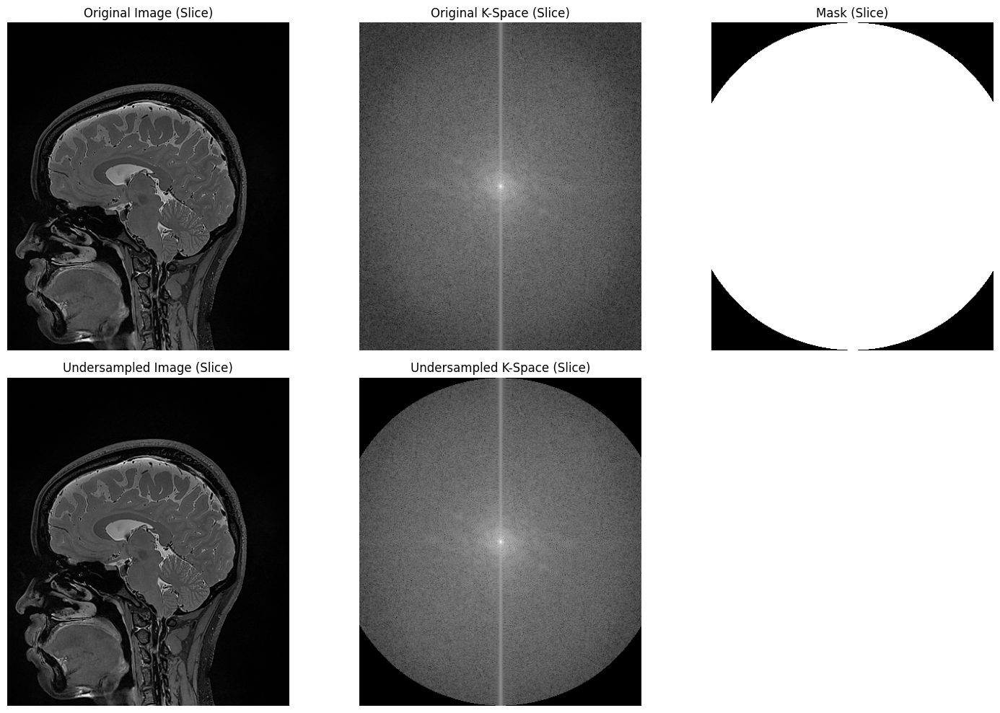

3D PSNR: 46.18
3D SSIM: 0.9929


In [93]:
process_3D_data_spherical_mask(R=0.5)

##### **8倍加速**

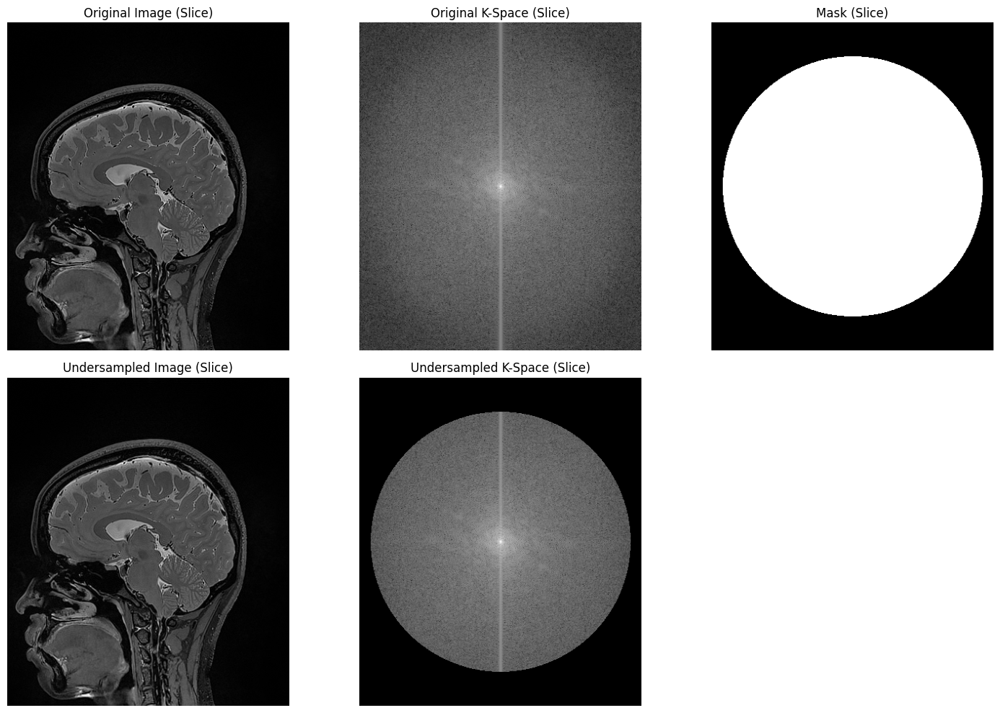

3D PSNR: 39.01
3D SSIM: 0.9929


In [94]:
process_3D_data_spherical_mask(R=0.25)